#Курсовая работа
Кузьменко С.В. БД-231
В данной работе проведем ABC, XYZ и RFM анализ датасета сервиса E-commerce

**Источник данных:** https://www.kaggle.com/datasets/carrie1/ecommerce-data/data

In [ ]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [ ]:
import pandas as pd
import numpy as np

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/course_project/data.csv', delimiter=',', encoding='unicode_escape')
df

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
...,...,...,...,...,...,...,...,...
541904,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,12/9/2011 12:50,0.85,12680.0,France
541905,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,12/9/2011 12:50,2.10,12680.0,France
541906,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,12/9/2011 12:50,4.15,12680.0,France
541907,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,12/9/2011 12:50,4.15,12680.0,France


In [ ]:
df_cp = df.copy()

In [ ]:
df = df_cp

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   InvoiceNo    541909 non-null  object 
 1   StockCode    541909 non-null  object 
 2   Description  540455 non-null  object 
 3   Quantity     541909 non-null  int64  
 4   InvoiceDate  541909 non-null  object 
 5   UnitPrice    541909 non-null  float64
 6   CustomerID   406829 non-null  float64
 7   Country      541909 non-null  object 
dtypes: float64(2), int64(1), object(5)
memory usage: 33.1+ MB


In [ ]:
df = df.dropna(subset=['CustomerID'])

In [ ]:
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'])
df['CustomerID'] = df['CustomerID'].astype('int')
df = df.drop_duplicates()
df.info()

<ipython-input-28-5440358c1aa1>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'])
<ipython-input-28-5440358c1aa1>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['CustomerID'] = df['CustomerID'].astype('int')


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 406829 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   InvoiceNo    406829 non-null  object        
 1   StockCode    406829 non-null  object        
 2   Description  406829 non-null  object        
 3   Quantity     406829 non-null  int64         
 4   InvoiceDate  406829 non-null  datetime64[ns]
 5   UnitPrice    406829 non-null  float64       
 6   CustomerID   406829 non-null  int64         
 7   Country      406829 non-null  object        
dtypes: datetime64[ns](1), float64(1), int64(2), object(4)
memory usage: 27.9+ MB


Поменяем типы данных и удалим дубликаты

In [ ]:
df = df.dropna(subset=['CustomerID'])
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'])
df['CustomerID'] = df['CustomerID'].astype('int')
df = df.drop_duplicates()
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 401604 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   InvoiceNo    401604 non-null  object        
 1   StockCode    401604 non-null  object        
 2   Description  401604 non-null  object        
 3   Quantity     401604 non-null  int64         
 4   InvoiceDate  401604 non-null  datetime64[ns]
 5   UnitPrice    401604 non-null  float64       
 6   CustomerID   401604 non-null  int64         
 7   Country      401604 non-null  object        
dtypes: datetime64[ns](1), float64(1), int64(2), object(4)
memory usage: 27.6+ MB


In [ ]:
df['Costs'] = df['Quantity'] * df['UnitPrice']

Удалим сделки со стоимостью < 0, так как это возвраты товара, их не учитываем

In [ ]:
df = df[df['Costs'] > 0 ]
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 392692 entries, 0 to 541908
Data columns (total 9 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   InvoiceNo    392692 non-null  object        
 1   StockCode    392692 non-null  object        
 2   Description  392692 non-null  object        
 3   Quantity     392692 non-null  int64         
 4   InvoiceDate  392692 non-null  datetime64[ns]
 5   UnitPrice    392692 non-null  float64       
 6   CustomerID   392692 non-null  int64         
 7   Country      392692 non-null  object        
 8   Costs        392692 non-null  float64       
dtypes: datetime64[ns](1), float64(2), int64(2), object(4)
memory usage: 30.0+ MB


In [ ]:
df['Costs'] = df['Quantity'] * df['UnitPrice']
df = df[df['Costs'] > 0]
df

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Costs
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850,United Kingdom,15.30
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850,United Kingdom,22.00
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34
...,...,...,...,...,...,...,...,...,...
541904,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,2011-12-09 12:50:00,0.85,12680,France,10.20
541905,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,2011-12-09 12:50:00,2.10,12680,France,12.60
541906,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,2011-12-09 12:50:00,4.15,12680,France,16.60
541907,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,2011-12-09 12:50:00,4.15,12680,France,16.60


In [ ]:
data = df

Загрузка данных в BigQuery

In [ ]:
#Dataset with Table name variable
BqDatasetwithtable='Course_work.Data'
#BQproject name variable
BqProject='vocal-tracker-416011'
# pandas-gbq method to load data
# append data if data table exists in BQ project
# set chunk size of records to be inserted
data.to_gbq(BqDatasetwithtable, BqProject, chunksize=20000, if_exists='append' )

100%|██████████| 1/1 [00:00<00:00, 1603.94it/s]


In [ ]:
!pip install openpyxl

In [ ]:
data.to_excel(r'C:\Users\Сергей\Desktop\data.xlsx')

## ABC анализ товаров
**Методика:** ABC анализ основан на принципе Парето «соотношение 80 на 20». В нашем случае с акцентом на продукт: 20 % товаров обеспечивают 80 % прибыли магазина. Поэтому для проведения анализа для необходимо сгруппировать данные по коду товара, вычислить процент продаж товара от общей суммы продаж, отсортировать по убываю и рассчитать кумулятивную сумму. Далее товары делятся на три класса сверху вниз:

* Класс А: Первые товары, накопительная сумма которых меньше 20 %. Это товары, которые вносят основной вклад в формирование выручки
* Класс B: Следующая группа товаров с накопительной суммой от 20 до 80 %. Это товары “среднего класса”. Влияют на формирование выручки, но не вносят определяющий вклад
* Класс С: Оставшиеся товары с накопительной суммой от 80 до 100 %. Товары, которые меньше всего влияют на выручку магазина.

In [ ]:
df_abc = df.groupby('StockCode')['Costs'].agg(np.sum).to_frame().reset_index()\
.sort_values('Costs', ascending=False).reset_index()

total = df_abc['Costs'].sum()
df_abc['percent'] = df_abc['Costs'] / total
df_abc = df_abc.drop(['index'], axis = 1)
df_abc['cs_percent'] = df_abc['percent'].cumsum()
df_abc['ABC'] = df_abc.apply(lambda row: 'A' if row.cs_percent < 0.2
                         else ('С' if row.cs_percent > 0.8
                               else 'B')
                          , axis = 1)

df_res = df.merge(df_abc[['StockCode', 'ABC']], left_on='StockCode', right_on='StockCode')
df_res

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Costs,ABC
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850,United Kingdom,15.30,A
1,536373,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 09:02:00,2.55,17850,United Kingdom,15.30,A
2,536375,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 09:32:00,2.55,17850,United Kingdom,15.30,A
3,536390,85123A,WHITE HANGING HEART T-LIGHT HOLDER,64,2010-12-01 10:19:00,2.55,17511,United Kingdom,163.20,A
4,536394,85123A,WHITE HANGING HEART T-LIGHT HOLDER,32,2010-12-01 10:39:00,2.55,13408,United Kingdom,81.60,A
...,...,...,...,...,...,...,...,...,...,...
392687,580691,90214W,"LETTER ""W"" BLING KEY RING",12,2011-12-05 15:48:00,0.29,13790,United Kingdom,3.48,С
392688,580691,90214Z,"LETTER ""Z"" BLING KEY RING",12,2011-12-05 15:48:00,0.29,13790,United Kingdom,3.48,С
392689,580865,90089,PINK CRYSTAL SKULL PHONE CHARM,12,2011-12-06 11:58:00,0.19,17914,United Kingdom,2.28,С
392690,581425,90089,PINK CRYSTAL SKULL PHONE CHARM,1,2011-12-08 15:31:00,0.19,14796,United Kingdom,0.19,С


In [ ]:
df_abc

,StockCode,Costs,percent,cs_percent,ABC
0,23843,168469.600,1.895641e-02,0.018956,A
1,22423,142264.750,1.600781e-02,0.034964,A
2,85123A,100547.450,1.131373e-02,0.046278,A
3,85099B,85040.540,9.568869e-03,0.055847,A
4,23166,81416.730,9.161114e-03,0.065008,A
...,...,...,...,...,...
3660,90084,0.850,9.564308e-08,1.000000,С
3661,90104,0.850,9.564308e-08,1.000000,С
3662,21268,0.840,9.451786e-08,1.000000,С
3663,84227,0.420,4.725893e-08,1.000000,С


## XYZ анализ товаров
**Методика:** XYZ анализ необходим для понимания стабильности спроса на товар. Для проведения такого анализа необходимо сгруппировать по товару и для каждого товара посчитать коэффициент вариации, как отношение стандартного отклонения количества единиц товара к среднему значению количества товара в одной транзакции для данного продукта . Затем товары разбиваются на три класса:
* Класс X: Коэффициент вариации от 0 до 10 %. Данные продукты имеют очень низкую дисперсию, то есть потребляются стабильно. Для них легко рассчитать объемы потребления и предсказать выручку к концу периода
* Класс Y: Коэффициент вариации от 10 до 25 %. Такие товары имеют больший разброс по количеству потребления, что означает сложность в прогнозировании. Необходимо изучать природу эти колебаний
* Класс Z: Коэффициент вариации более 25%. Говорит о случайности спроса. Такие товара сокращаются до минимума или исключаются из ассортимента.

In [ ]:
df_xyz = df.groupby('StockCode')['Quantity'].agg([np.mean, np.std]).reset_index()
df_xyz['VAR'] = df_xyz['std'] / df_xyz['mean']
df_xyz['XYZ'] = df_xyz.apply(lambda row: 'Z' if (row.VAR == 0
                                                 or row.VAR >= 0.25)
                         else ('X' if row.VAR < 0.1
                               else 'Y')
                          , axis = 1)
df_res = df_res.merge(df_xyz[['StockCode', 'XYZ']], left_on='StockCode', right_on='StockCode')
df_res

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Costs,ABC,XYZ
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850,United Kingdom,15.30,A,Z
1,536373,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 09:02:00,2.55,17850,United Kingdom,15.30,A,Z
2,536375,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 09:32:00,2.55,17850,United Kingdom,15.30,A,Z
3,536390,85123A,WHITE HANGING HEART T-LIGHT HOLDER,64,2010-12-01 10:19:00,2.55,17511,United Kingdom,163.20,A,Z
4,536394,85123A,WHITE HANGING HEART T-LIGHT HOLDER,32,2010-12-01 10:39:00,2.55,13408,United Kingdom,81.60,A,Z
...,...,...,...,...,...,...,...,...,...,...,...
392687,580691,90214W,"LETTER ""W"" BLING KEY RING",12,2011-12-05 15:48:00,0.29,13790,United Kingdom,3.48,С,Y
392688,580691,90214Z,"LETTER ""Z"" BLING KEY RING",12,2011-12-05 15:48:00,0.29,13790,United Kingdom,3.48,С,Y
392689,580865,90089,PINK CRYSTAL SKULL PHONE CHARM,12,2011-12-06 11:58:00,0.19,17914,United Kingdom,2.28,С,Z
392690,581425,90089,PINK CRYSTAL SKULL PHONE CHARM,1,2011-12-08 15:31:00,0.19,14796,United Kingdom,0.19,С,Z


In [ ]:
df_xyz

,StockCode,mean,std,VAR,XYZ
0,10002,16.795918,25.526114,1.519781,Z
1,10080,13.857143,11.363475,0.820045,Z
2,10120,6.620690,7.766291,1.173033,Z
3,10123C,1.666667,1.154701,0.692820,Z
4,10124A,3.200000,1.303840,0.407450,Z
...,...,...,...,...,...
3660,C2,1.007519,0.086711,0.086064,X
3661,DOT,1.000000,0.000000,0.000000,Z
3662,M,24.849462,141.096651,5.678057,Z
3663,PADS,1.000000,0.000000,0.000000,Z


## RFM анализ товаров
**Методика:** RFM-анализ применяется для сегментации клиенты, чтобы лучше понимать пользовательский опыт. Рассматриваются три показателя. Recency (давность) – количество дней с последней сделки. Frequency – частота. Как часто клиент совершает сделки. Monetary – заработанные деньги с клиента. Далее по каждому показателю данные сортируются (для Recency в порядке убывания, для Frequency и Monetary в порядке возрастания) и разбиваются по квантилям на заданное число групп.

In [ ]:
MAX_DATE = df['InvoiceDate'].max()
MAX_DATE

Timestamp('2011-12-09 12:50:00')

In [ ]:
df_rfm = df.groupby('CustomerID').agg({'InvoiceNo': ['nunique'],
                                      'InvoiceDate': ['max'],
                                      'Costs': ['sum']}).reset_index()

df_rfm['Recency'] = (MAX_DATE - df_rfm['InvoiceDate', 'max']) / np.timedelta64 ( 1 , 'D')
df_rfm['Frequency'] = df_rfm['InvoiceNo', 'nunique']
df_rfm['Monetary'] = df_rfm['Costs', 'sum']
df_rfm = df_rfm.drop(['InvoiceNo', 'InvoiceDate', 'Costs'] , axis = 1)
df_rfm = df_rfm.droplevel(1, axis=1)

In [ ]:
quantiles = df_rfm.quantile(q=[0.2,0.4,0.6,0.8])
quantiles

In [ ]:
quantiles = quantiles.to_dict()
def R_foo(x,p,d):
    if x <= d[p][0.2]:
        return 5
    elif x <= d[p][0.4]:
        return 4
    elif x <= d[p][0.6]:
        return 3
    elif x <= d[p][0.8]:
        return 2
    else:
        return 1

def F_M_foo(x,p,d):
    if x <= d[p][0.2]:
        return 1
    elif x <= d[p][0.4]:
        return 2
    elif x <= d[p][0.6]:
        return 3
    elif x <= d[p][0.8]:
        return 4
    else:
        return 5

df_rfm['R'] = df_rfm['Recency'].apply(lambda x: R_foo(x, 'Recency', quantiles))
df_rfm['F'] = df_rfm['Frequency'].apply(F_M_foo, args=('Frequency',quantiles,))
df_rfm['M'] = df_rfm['Monetary'].apply(F_M_foo, args=('Monetary',quantiles,))
df_rfm['RFM'] = df_rfm['R'].map(str) + df_rfm['F'].map(str)  + df_rfm['M'].map(str)

df_res = df_res.merge(df_rfm[['CustomerID', 'RFM']], left_on='CustomerID', right_on='CustomerID')
df_res

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Costs,ABC,XYZ,RFM
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850,United Kingdom,15.30,A,Z,155
1,536373,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 09:02:00,2.55,17850,United Kingdom,15.30,A,Z,155
2,536375,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 09:32:00,2.55,17850,United Kingdom,15.30,A,Z,155
3,536396,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 10:51:00,2.55,17850,United Kingdom,15.30,A,Z,155
4,536406,85123A,WHITE HANGING HEART T-LIGHT HOLDER,8,2010-12-01 11:33:00,2.55,17850,United Kingdom,20.40,A,Z,155
...,...,...,...,...,...,...,...,...,...,...,...,...
392687,571439,23515,EMBROIDERED RIBBON REEL DAISY,12,2011-10-17 13:25:00,2.08,17206,United Kingdom,24.96,С,Z,311
392688,571439,23514,EMBROIDERED RIBBON REEL SALLY,12,2011-10-17 13:25:00,2.08,17206,United Kingdom,24.96,С,Z,311
392689,571439,23518,EMBROIDERED RIBBON REEL RACHEL,12,2011-10-17 13:25:00,2.89,17206,United Kingdom,34.68,С,Z,311
392690,571439,23513,EMBROIDERED RIBBON REEL SUSIE,12,2011-10-17 13:25:00,2.08,17206,United Kingdom,24.96,С,Z,311


##Исследования в Google BigQuery
Такой же рассчет ABC, XYZ, RFM анализа был проведен в облачном интерфейсе BigQuery. Здесь представлен фотоотчет

**ABC анализ**

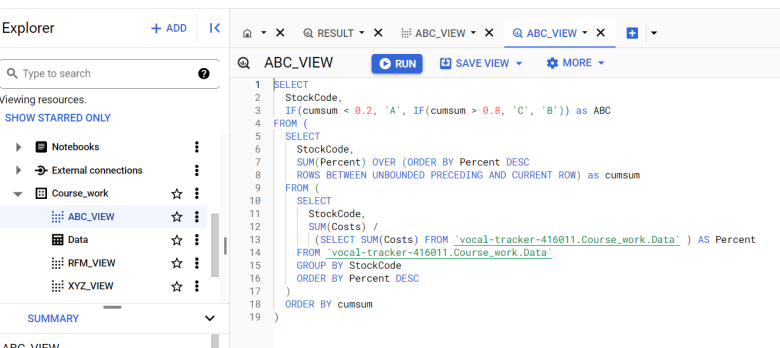

**XYZ анализ**

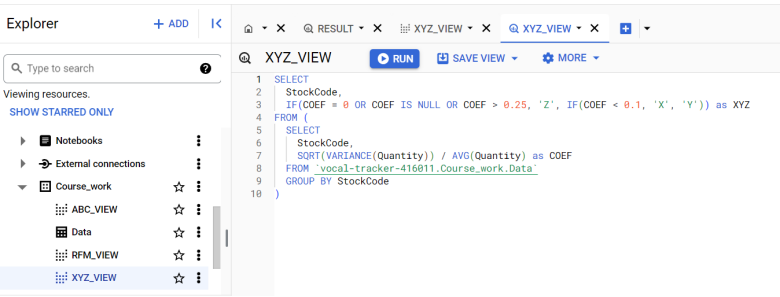

**RFM анализ**

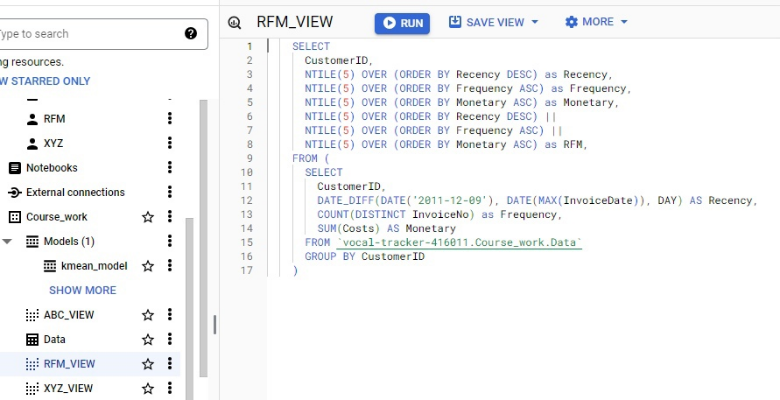

**Объединение**

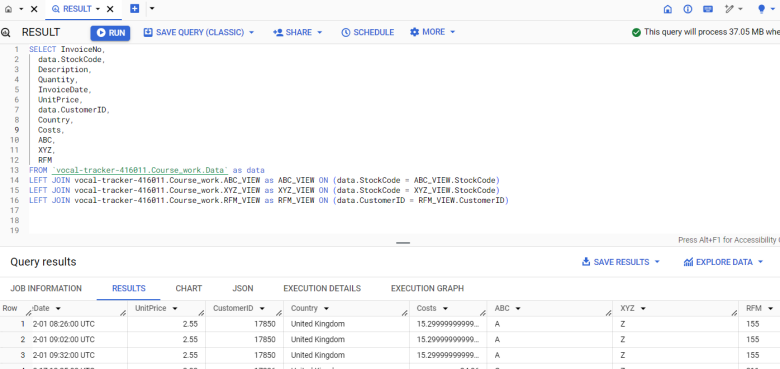

Кластеризация показателей RFM на 4 группы

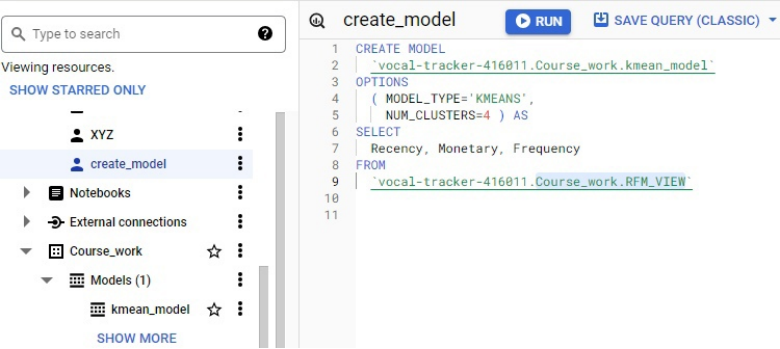

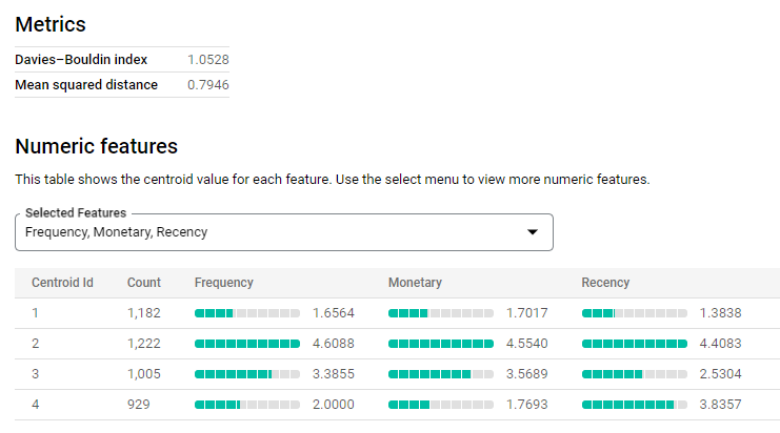

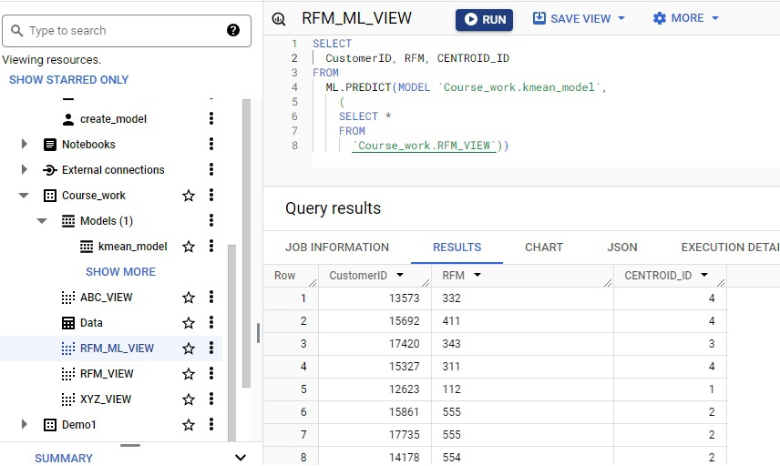

**Вывод:** По координатам центров кластеров можно понять, что 4 кластер объединяет относительно новых клиентов. Последний заказ у них был недавно, частотность и прибыль пока невысокие. Кластер 2 объединяет самых лояльных клиентов с высокой прибылью и частотой. Кластер 3 включает в себя постоянных клиентов. А вот кластер 1 объединяет клиентов в зоне риска. Последний заказ был достаточно давно, низкая частотность и низкая выручка.